# Human Mask Object Detection, using Custom Fine-Tuned Faster-RCNN

Rather than just detecting mask-on detections, this model performs multi-class object detection and detects all non-mask faces, along with mask-wearing faces in scene.

We'll be applying transfer learning and fine-tuning on a pre-trained Faster-RCNN model, to make it perform human mask object detection.

This notebook develops the model using a custom Mask Detection dataset, which combines many existing mask object detection datasets, including the Moxa3K, Kaggle Mask Dataset and Web Cam Mask Detection datasets. The benefit of combining these datasets is that our model is exposed to a wide range of both simple and complex scenes containing people with and without masks.

The overall goal is to develop a mask detector that works well with distanced scenes, similarly to those expected from surveillance cameras within a designated area. This is typically where a mask detection framework as developed in this project would have most value.

**Author:** Ben Fraser, https://github.com/BenjaminFraser

---

**Table of Contents:**

1. [Importing dependencies and setting up directories & data](#imports)
2. [Dataset loading, processing and exploration](#data-processing)
3. [Dataset Cleaning and Reformatting](#data-cleaning)
    - 3.1 [Label consistency improvements](#label-consistency)
    - 3.2 [Analysis of bounding-box sizes and removal of outliers](#outlier-removal)
    - 3.3 [Visualising examples from data](#example-vis)
4. [Splitting into suitable training and test data](#data-splitting)
5. [Faster-RCNN Object Detection Model Development](#model-development)
    - 5.1 [Production of a PyTorch Custom Mask Dataset / Dataloader](#dataloader)
    - 5.2 [Development and Training of the Object Detection Model](#training)
    - 5.3 [Example predictions on validation data samples](#example-validation)
6. [Saving model for downloading and future inference](#saving)
7. [Inference on test data and unseen examples](#test-inference)
8. [Further inference analysis on completely new data](#novel-inference)

## 1. Installing and Importing Dependencies

In [2]:
# install pycocotools and various dependencies (if required)
#!pip install -q cython pyyaml==5.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
import cv2
import gc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import os
import pandas as pd
import PIL.Image as Image
import random
import seaborn as sns
import skimage.color
import skimage.io
import tensorflow as tf
import tensorflow.keras as keras
import torch, torchvision
import xml.etree.ElementTree as ET

from datetime import datetime
from keras.applications import xception
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import rc
from matplotlib.lines import Line2D
from matplotlib.colors import rgb_to_hsv
from pylab import rcParams
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm

Set device (CPU or GPU):

In [11]:
# ensure we're using GPU if we're planning on training
if torch.cuda.is_available():
    print("GPU in use.")
    device = torch.device('cuda')
else:
    print("Warning - CPU in use (if training change to GPU).")
    device = torch.device('cpu')

GPU in use.


**Note:** If training (rather than loading an existing model), ensure GPU is active, otherwise this will take too long. For this reason, this notebook is executed on Google Colab for GPU support.

Set up main directory paths within project:

In [5]:
# connect to local drive for data files
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
INPUT_DIR = os.getcwd()

In [13]:
# define our dir and associated files stored on drive
DRIVE_DATA_DIR = 'drive/My\ Drive/ML_Data/Mask_Object_Detection'
DRIVE_DATA_FILENAME = 'mask_object_detection_dataset_cleaned.zip'

# define our main folders relative to input DIR
PROJECT_DIR = os.path.join(INPUT_DIR, 'custom_mask_dataset_cleaned')
IMAGE_DIR = os.path.join(PROJECT_DIR, 'Images')
ANNOTATIONS_DIR = os.path.join(PROJECT_DIR, 'Annotations')

In [8]:
# set paths to images and annotations
drive_data_file = os.path.join(DRIVE_DATA_DIR, DRIVE_DATA_FILENAME)

# unzip dataset move to local instance
!unzip {drive_data_file} -d {INPUT_DIR}

Streaming output truncated to the last 5000 lines.
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_2906.xml  
  inflating: /content/__MACOSX/custom_mask_dataset_cleaned/Annotations/._MOXA_2906.xml  
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_501.xml  
  inflating: /content/__MACOSX/custom_mask_dataset_cleaned/Annotations/._MOXA_501.xml  
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_31.xml  
  inflating: /content/__MACOSX/custom_mask_dataset_cleaned/Annotations/._MOXA_31.xml  
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_2090.xml  
  inflating: /content/__MACOSX/custom_mask_dataset_cleaned/Annotations/._MOXA_2090.xml  
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_1599.xml  
  inflating: /content/__MACOSX/custom_mask_dataset_cleaned/Annotations/._MOXA_1599.xml  
  inflating: /content/custom_mask_dataset_cleaned/Annotations/MOXA_267.xml  
  inflating: /content/__MACOSX/custom_mask_

We also need the PyTorch utilities to help work with FRCNN object detection models (for this you need to get the folder available at https://github.com/pytorch/vision/tree/main/references/detection.

This has been stored on my Google Drive, and so this will have to be stored either locally or on Google Drive (if running from Colab) as required. The files for this will be copied across as below:

In [9]:
# copy pytorch object detection training and inference helper library 
# (directory available from pytorch/references/detection/ on github)
!cp -a "drive/My Drive/ML_Data/pytorch_detection_tools" {INPUT_DIR}

# move above files into current working directory for convenience
!mv -v {INPUT_DIR}/pytorch_detection_tools/* .

renamed '/content/pytorch_detection_tools/coco_eval.py' -> './coco_eval.py'
renamed '/content/pytorch_detection_tools/coco_utils.py' -> './coco_utils.py'
renamed '/content/pytorch_detection_tools/engine.py' -> './engine.py'
renamed '/content/pytorch_detection_tools/group_by_aspect_ratio.py' -> './group_by_aspect_ratio.py'
renamed '/content/pytorch_detection_tools/presets.py' -> './presets.py'
renamed '/content/pytorch_detection_tools/README.md' -> './README.md'
renamed '/content/pytorch_detection_tools/train.py' -> './train.py'
renamed '/content/pytorch_detection_tools/transforms.py' -> './transforms.py'
renamed '/content/pytorch_detection_tools/utils.py' -> './utils.py'


We can now import the modules from these files into our notebook, as follows:

In [15]:
# import helper functions from above detection custom folder
from engine import train_one_epoch, evaluate
import utils

In [16]:
# set seeds for consistency of results throughout
RANDOM_SEED = 23
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

We should have an equal number of image files and annotation files, which we'll check below:

In [17]:
IMAGE_EXT = '.jpg'

image_files = [x for x in os.listdir(IMAGE_DIR) if x.endswith(IMAGE_EXT)]
annotation_files = [x for x in os.listdir(ANNOTATIONS_DIR) if x.endswith('.xml')]

print(f"Number of image files: {len(image_files)}")
print(f"Number of annotation files: {len(annotation_files)}")

Number of image files: 3650
Number of annotation files: 3650


## 2. Dataset loading, processing and exploration

Our annotations for each image are located within the annotations folder, in xml format. To read all of our labels we'll define a simple function to parse each xml file and obtain the bounding box features for each image.

In [18]:
def read_xml_annotations(xml_filename: str, height_width_scaling=None):
    """ Parse our xml object detection bounding box annotations from
        file and return all classes with associated co-ords in
        [x_min, y_min, x_max, y_max] format. """

    tree = ET.parse(xml_filename)
    root = tree.getroot()
    
    # arrays to store class label and associated bbox coords
    classes = []
    bounding_boxes = []
    
    # iterate through all objects in file, gather class & bbox coords
    for boxes in root.iter('object'):

        filename = root.find('filename').text
        
        x_min, y_min, x_max, y_max = None, None, None, None

        # get class name and associated bbox coords
        class_name = boxes.find("name").text
        x_min = int(float(boxes.find("bndbox/xmin").text))
        y_min = int(float(boxes.find("bndbox/ymin").text))
        x_max = int(float(boxes.find("bndbox/xmax").text))
        y_max = int(float(boxes.find("bndbox/ymax").text))
        
        # add current class & bbox to our collection for this image
        bounding_boxes.append([x_min, y_min, x_max, y_max])
        classes.append(class_name)

    return filename, classes, bounding_boxes

In [19]:
def load_image(path, convert_rgba=True):
    """Load the specified image and return a [H,W,3] Numpy array."""
    # Load image
    image = skimage.io.imread(path)
    # If grayscale. Convert to RGB for consistency.
    if image.ndim != 3:
        image = skimage.color.gray2rgb(image)
        
    # if rgba - convert to rgb for consistency
    if convert_rgba and image.shape[2] == 4:
        image = skimage.color.rgba2rgb(image)
    return image

Let's test this on a sample file to ensure it works:

In [20]:
example_results = read_xml_annotations(os.path.join(ANNOTATIONS_DIR, 
                                                    os.listdir(ANNOTATIONS_DIR)[0]))

example_results

('MOXA_714.jpg', ['mask', 'mask'], [[224, 80, 268, 136], [126, 245, 135, 261]])

Let's look at this image to get an idea of whats in the scene:

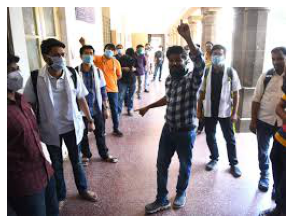

In [21]:
img_array = load_image(os.path.join(IMAGE_DIR, 'MOXA_2428.jpg'))
plt.figure(figsize=(5,4))
plt.imshow(img_array)
plt.axis('off')
plt.show()

Good, it appears to work in this case. As we can see, we have a potentially large number of masks within each image. We'll extract all of these into a unified dataset for ease of modelling later. The reason for this is so that we adopt a consistent process, whereby later if we need extra images that are in say YOLO or Pascal VOC format annotations, we can simply adapt these to the same consistent approach. 

In other words, we might not always be using xml format annotations, and so we want to a more universal / annotation format agnostic approach.

We want a dataset in .csv format that has a row for every single object annotation, with details of the image name, class name, and associated bbox co-ordinates. We'll do this using the function defined below:

Let's now define our function to create a unified dataset of annotation labels:

In [22]:
def make_labels_df_from_dir(img_dir, labels_dir, get_label_func, 
                            img_ext='.png', labels_ext='xml'):
    """ Combines all yolo formatted labels from a selected directory
        and places them into a dataframe. Must provide a get_label_func to
        precisely extract the labels from the annotations file """
    
    records = []
    labels_files = [x for x in os.listdir(labels_dir) 
                    if x.endswith(labels_ext) and x != 'classes.txt']
    
    # get annotation labels for all our images
    for label_file in labels_files:
        img_labels = get_label_func(label_file, 
                                    img_dir,
                                    labels_dir,
                                    img_ext)
        
        records.extend(img_labels)
        
    # create a final dataframe of results
    results_df = pd.DataFrame(records)   
    
    return results_df


def get_labels_from_xml_file(labels_filename, img_dir=IMAGE_DIR, 
                             labels_dir=ANNOTATIONS_DIR, img_ext='.png'):
    """ Combines bounding box labels for given image into a dataframe """ 

    base_name = labels_filename[:-4]
    img_path = os.path.join(img_dir, f"{base_name}{img_ext}")
    labels_path = os.path.join(labels_dir, labels_filename)

    # extract class names and bbox coords from current image
    _, class_labels, bbox_coords = read_xml_annotations(labels_path)

    # load image and get height and width
    try:
        img = load_image(img_path)
        img_height, img_width, _ = img.shape
    except FileNotFoundError:
        img_height, img_width = "No image found", "No image found"

    # create array to store labels
    records = []

    # gather all bounding boxes for given image
    for idx, class_name in enumerate(class_labels):
        
        # get bbox coords for current class_name object
        x_min, y_min, x_max, y_max = bbox_coords[idx]
        
        # form a dict with all our desired quantities
        record = {'filename' : f"{base_name}{img_ext}", 
                  'img_width' : img_width,
                  'img_height' : img_height, 
                  'object' : class_name,
                  'x_min' : x_min, 'y_min' : y_min, 
                  'x_max' : x_max, 'y_max' : y_max}
        records.append(record)
    return records

In [23]:
labels_df = make_labels_df_from_dir(img_dir=IMAGE_DIR, 
                                    labels_dir=ANNOTATIONS_DIR, 
                                    get_label_func=get_labels_from_xml_file,
                                    img_ext=IMAGE_EXT)

In [24]:
labels_df.shape

(16482, 8)

In [25]:
labels_df.head(5)

,filename,img_width,img_height,object,x_min,y_min,x_max,y_max
0,MOXA_714.jpg,660,405,mask,224,80,268,136
1,MOXA_714.jpg,660,405,mask,126,245,135,261
2,MOXA_740.jpg,480,270,mask,200,44,287,200
3,MOXA_740.jpg,480,270,mask,59,117,104,190
4,MOXA_740.jpg,480,270,mask,124,150,173,216


In [26]:
labels_df['object'].value_counts()

mask            7404
with-mask       3076
nomask          2338
without-mask    2314
unsure           684
with_mask        316
without_mask     142
0                 82
1                 81
2                 45
Name: object, dtype: int64

## 3. Dataset Cleaning and Formatting Improvements

### 3.1 Label consistency corrections

Let's alter these values to make them consistent with those previously used from the Kaggle mask dataset:

In [27]:
# make these class outputs consistent with our previous ones
correction_dict = {'mask' : 'with_mask',
                   'nomask' : 'without_mask',
                   'NM' : 'without_mask', 
                   'MW' : 'with_mask',
                   'with-mask' : 'with_mask',
                   'without-mask' : 'without_mask',
                   '0' : 'with_mask',
                   '1' : 'without_mask',
                   '2' : 'unsure'}

labels_df['object'] = labels_df['object'].replace(correction_dict)

In [28]:
labels_df['object'].value_counts()

with_mask       10878
without_mask     4875
unsure            729
Name: object, dtype: int64

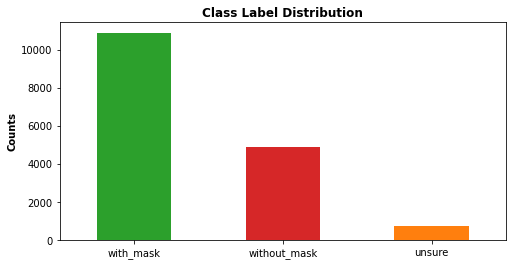

In [29]:
labels_df['object'].value_counts().plot.bar(
        color=['tab:green', 'tab:red', 'tab:orange'],
        figsize=(8,4))
plt.ylabel("Counts", weight="bold")
plt.xticks(rotation=0)
plt.title("Class Label Distribution", weight="bold")
plt.show()

Within this dataset we have examples of images with persons without masks and with masks. We have 3 times more people with masks than without, and so it's likely our model may become better (due to the imbalance) at classifying masks, rather than without.

This is something we can look to improve later through either rebalancing, class weights, data-augmentation, or seeking further data.

There are also a huge number of unsure annotations in the dataset. There really is no point leaving these in the data we're curating, since these will generally be of very low quality, whereby its impossible to tell whether the person is wearing a mask or not. It's also likely many of these unsure classes are very small annotations, which would be of little value anyway.

In [30]:
# get unsure indices and drop from our data
unsure_idxs = labels_df.loc[labels_df['object'] == 'unsure'].index
labels_df = labels_df.drop(unsure_idxs)

# reindex our dataframe after droping
labels_df = labels_df.reset_index(drop=True)

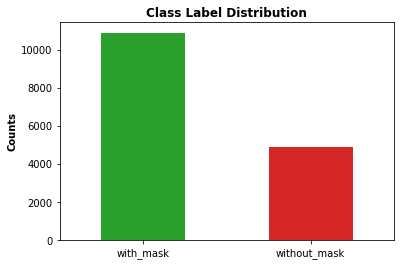

In [31]:
labels_df['object'].value_counts().plot.bar(
        color=['tab:green', 'tab:red'],
        figsize=(6,4))
plt.ylabel("Counts", weight="bold")
plt.xticks(rotation=0)
plt.title("Class Label Distribution", weight="bold")
plt.show()

Good, we now have only two classes as required.

### 3.2 Analysing Bounding Box size distributions and removing outliers (if needed)

We have an erroneous image annotation where all of the bounding boxes are zero:

In [32]:
zero_annots = ((labels_df['x_min'] == 0) & (labels_df['x_max'] == 0) & 
               (labels_df['y_min'] == 0) & (labels_df['y_max'] == 0))

labels_df.loc[zero_annots]

,filename,img_width,img_height,object,x_min,y_min,x_max,y_max


In [34]:
#img_array = load_image(os.path.join(IMAGE_DIR, 'MOXA_1029.jpg'))
#plt.figure(figsize=(5,4))
#plt.imshow(img_array)
#plt.axis('off')
#plt.show()

As shown, these are all associated with image 'MOXA_1029.jpg'.

Let's just remove this from the dataset to resolve any issues with this later on.

In [35]:
# gather erroneous indices for image and drop
idx_to_drop = labels_df.loc[zero_annots].index

labels_df = labels_df.drop(idx_to_drop)

# reindex our dataframe after droping
labels_df = labels_df.reset_index(drop=True)

We also have some images and annotations that are way too large. Since these appear erroneous, we'll just remove them entirely from the dataset.

In [36]:
large_values = ((labels_df['x_min'] > 5000) | (labels_df['x_max'] > 5000) | 
                (labels_df['y_min'] > 5000) | (labels_df['y_max'] > 5000))

labels_df.loc[large_values]

,filename,img_width,img_height,object,x_min,y_min,x_max,y_max


In [37]:
# gather erroneous indices for image and drop
idx_to_drop = labels_df.loc[large_values].index
labels_df = labels_df.drop(idx_to_drop)

# reindex our dataframe after droping
labels_df = labels_df.reset_index(drop=True)

In [38]:
labels_df['delta_x'] = labels_df['x_max'] - labels_df['x_min']
labels_df['delta_y'] = labels_df['y_max'] - labels_df['y_min']

print(f"Min Annotation Width = {labels_df['delta_x'].min()}")
print(f"Min Annotation Height = {labels_df['delta_y'].min()}")

print(f"Max Annotation Width = {labels_df['delta_x'].max()}")
print(f"Max Annotation Height = {labels_df['delta_y'].max()}")

print(f"Mean Annotation Width = {labels_df['delta_x'].mean()}")
print(f"Mean Annotation Height = {labels_df['delta_y'].mean()}")

Min Annotation Width = 3
Min Annotation Height = 1
Max Annotation Width = 882
Max Annotation Height = 1248
Mean Annotation Width = 55.39414714657526
Mean Annotation Height = 70.48244778772298


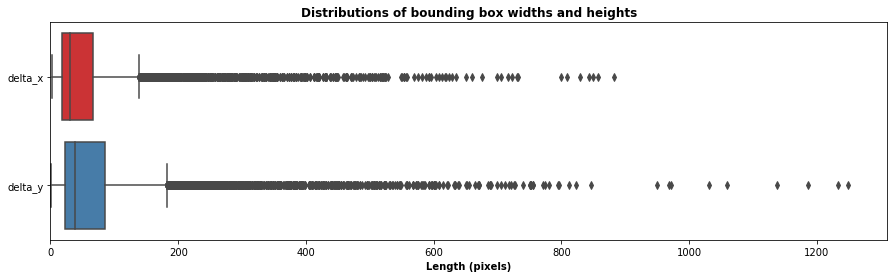

In [39]:
plt.figure(figsize=(15,4))
sns.boxplot(data=labels_df.loc[:, ['delta_x', 'delta_y']], orient="h", palette="Set1")
plt.xlim(0)
plt.xlabel("Length (pixels)", weight="bold")
plt.title("Distributions of bounding box widths and heights", weight="bold")
plt.show()

Some of the height and width annotations only span 1/2 pixels, as shown above. It's better to just remove these entirely, since they won't generally be any use to our model.

We'll remove all bounding boxes with either a height or width below a given amount (say, 10 pixels). This will ensure that we are only left with reasonable size boxes:

In [40]:
# get bounding boxes below a given height or width
low_thresh = 20
high_thresh = 800

small_bboxs = ((labels_df['delta_x'] <= low_thresh) | 
               (labels_df['delta_y'] <= low_thresh))
small_bbox_idx = labels_df.loc[small_bboxs].index

large_bboxs = ((labels_df['delta_x'] >= high_thresh) | 
               (labels_df['delta_y'] >= high_thresh))
large_bbox_idx = labels_df.loc[large_bboxs].index

# drop these from our dataset
labels_df = labels_df.drop(small_bbox_idx)
labels_df = labels_df.drop(large_bbox_idx)

# reindex our dataframe after droping
labels_df = labels_df.reset_index(drop=True)

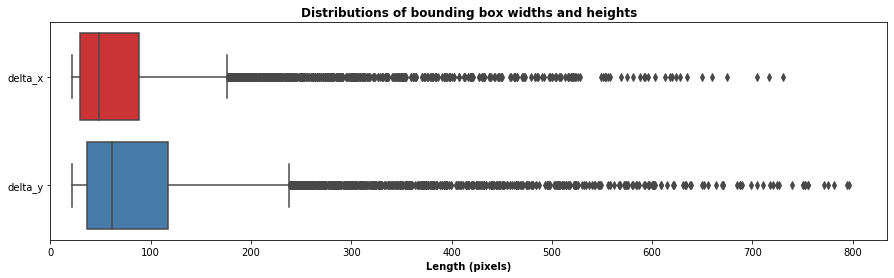

In [41]:
plt.figure(figsize=(15,4))
sns.boxplot(data=labels_df.loc[:, ['delta_x', 'delta_y']], orient="h", palette="Set1")
plt.xlim(0)
plt.xlabel("Length (pixels)", weight="bold")
plt.title("Distributions of bounding box widths and heights", weight="bold")
plt.show()

Our remaining image annotations should (hopefully) be more appropriate for training our model. We'll analyse some examples from the dataset to ensure this is the case below.

### 3.3 Visualising examples from the data

Lets visualise some examples from the dataset with the associated annotations plotted.

In [42]:
# color map dictionary for different classes
color_map = {'with_mask' : [0.0, 255.0, 0.0],
             'without_mask' : [255.0, 0.0, 0.0]}

In [43]:
def draw_box(img, img_labels, color_map, t=2):
    """Draw 3-pixel width bounding boxes on the given image array.
    color: list of 3 int values for RGB. 
    t: Thickness of bounding box in pixels
    """
    # make a copy of the image to annotate
    annot_img = img.copy()

    # get x/y co-ords for all bboxes
    boxes = img_labels[['x_min', 'y_min', 'x_max', 'y_max']].values
    
    # get object labels for each bounding box
    object_labels = img_labels['object'].values
    
    # find number of boxes for given image
    num_boxes = boxes.shape[0]

    # convert bboxes to integers
    bboxes = boxes.astype(int)

    # iterate through all boxes and plot
    for i in range(num_boxes):
        # get co-ords for current bbox
        x_min, y_min, x_max, y_max = bboxes[i]
        
        # get associated color, subject to object type
        color = color_map[object_labels[i]]

        # plot bbox on image with desired thickness
        annot_img[y_min:y_min + t, x_min:x_max] = color
        annot_img[y_max:y_max + t, x_min:x_max] = color
        annot_img[y_min:y_max, x_min:x_min + t] = color
        annot_img[y_min:y_max, x_max:x_max + t] = color

    return annot_img, num_boxes


def plot_annotations(img_name, labels_df, data_dir=IMAGE_DIR, 
                     color_map=color_map, figsize=(12,10), legend=False):
    """ Helper function for plotting image & annotations """ 
    img = load_image(f"{data_dir}/{img_name}")
    img, num_boxes = draw_box(img, 
                        labels_df.loc[labels_df['filename'] == img_name],
                        color_map)
    
    plt.figure(figsize=figsize)
    plt.title(img_name, size=10)
    plt.imshow(img)
    plt.axis('off')
    
    # if legend chosen, annotate what class is which color
    if legend:
        # map color map colors to matplotlib style colors
        mpl_color_map = dict()
        for object_name in color_map.keys():
            mpl_color_map[object_name] = tuple([i/255 for i 
                                            in color_map[object_name]])
    
        # get object names and create legend lines for each class type
        object_ids = list(color_map.keys())
    
        legend_lines = [Line2D([0],[0], color=mpl_color_map[object_ids[i]], lw=2) 
                        for i in range(len(object_ids))]
        plt.legend(legend_lines, object_ids, loc='best')
        
    plt.show()
    print(f"\nNumber of annotations: {num_boxes}")
    return

In [44]:
random_images = np.random.choice(labels_df['filename'].unique(), size=5)

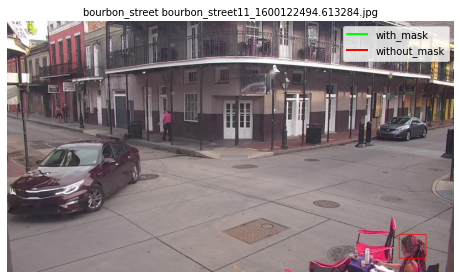


Number of annotations: 1


In [45]:
plot_annotations(random_images[0], labels_df, figsize=(8,6), legend=True)

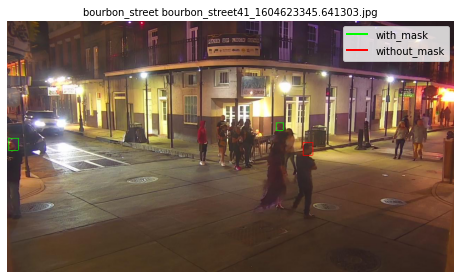


Number of annotations: 3


In [46]:
plot_annotations(random_images[2], labels_df, figsize=(8,6), legend=True)

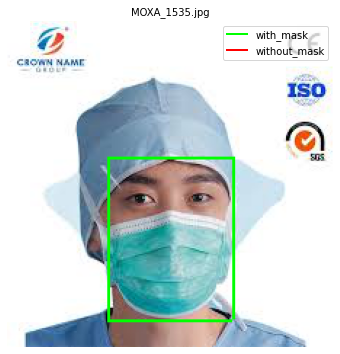


Number of annotations: 1


In [47]:
plot_annotations(random_images[3], labels_df, figsize=(8,6), legend=True)

In [48]:
labels_df['filename'].unique().shape

(3650,)

After all the cleaning operations above, we have eliminated around ~1500 images from our dataset, since some of them were just ineffective for training a consistent model.

## 4. Splitting into training and test partitions

We'll create an object class mapper (to give all unique output labels (mask-on / mask-off) unique ids) for our dataset, which will be used by our models later.

We'll then split the data into training and test, based on original image ids. This ensure that we're not using any of the same images for training and test, to give us the best estimations of real-world generalisation (assuming we don't have duplicate images with different names in the dataset).

In [49]:
# define a class map for our model(s) - reserve 0 for background
OBJECT_CLASS_MAP = {1 : 'with_mask',
                    2 : 'without_mask'}

# get a reverse mapping of this for convenience
reverse_object_map = {v : k for k,v in OBJECT_CLASS_MAP.items()}

# create a new column in our labels dataset with object ids
labels_df['object_id'] = labels_df['object'].map(reverse_object_map)

In [50]:
mask_df = labels_df.copy()

# we only have one class now, but create a list for class(es) regardless
classes = mask_df['object'].unique().tolist()

# create training and test split
train_proportion = 0.85
unique_files = mask_df.filename.unique()
train_files = set(np.random.choice(unique_files, 
                                   int(len(unique_files) * train_proportion), 
                                   replace=False))
train_df = mask_df[mask_df.filename.isin(train_files)]
test_df = mask_df[~mask_df.filename.isin(train_files)]

print(f"Shape of training data: {train_df.shape}")
print(f"Shape of test data: {test_df.shape}")

Shape of training data: (9242, 11)
Shape of test data: (1542, 11)


## 5. Faster-RCNN Model Development

### 5.1 Production of a custom dataset for Mask Detection

This class needs to accept our mask input images and associated label dataset.

In [51]:
class MaskTrainDataset(torch.utils.data.Dataset):
    """ Custom mask dataset, inherited from PyTorch Dataset """
    def __init__(self, data_df, data_dir=IMAGE_DIR, transforms=None):
        self.train_data = data_df
        self.data_dir = data_dir
        self.transforms = transforms

        # get names for all train images
        self.train_imgs = self.train_data.filename.unique()

    def __getitem__(self, idx: int):
        # load image and associated data
        img_name = self.train_imgs[idx]
        img_path = os.path.join(self.data_dir, img_name)
        bboxes = self.train_data[self.train_data['filename'] == img_name]
        
        # get class labels for our associated bboxes
        labels = bboxes['object_id'].values
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # load image, standardise, and convert to tensor
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img /= 255.0
        img = torchvision.transforms.ToTensor()(img)

        image_id = torch.tensor([idx])

        # bounding box co-ords for selected image
        boxes = bboxes[['x_min', 'y_min', 'x_max', 'y_max']].values
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # suppose all instances are not crowd
        iscrowd = torch.zeros((bboxes.shape[0],), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        # if transforms selected, apply
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.train_imgs)

In [52]:
# Initialize train and test dataset
train_dataset = MaskTrainDataset(train_df, data_dir=IMAGE_DIR)
val_dataset = MaskTrainDataset(test_df, data_dir=IMAGE_DIR)

def collate_fn(batch):
    return tuple(zip(*batch))

# create train dataloader
train_dataloader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn)

# create validation dataloader
val_dataloader = DataLoader(val_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn)

Lets load and plot some of our images, which helps confirm that everything has been set up correctly:

In [53]:
def image_convert(image):
    """ Process image for visualising """
    image = image.clone().cpu().numpy()
    image = image.transpose((1,2,0))
    image = (image * 255).astype(np.uint8)
    return image

def plot_img(data, idx, figsize=(6,6)):
    """ Helper function for plotting img & bboxes """ 
    # get image and convert to numpy array shape (h, w, c)
    out = data[idx]
    image = image_convert(out[0])
    image = np.ascontiguousarray(image)
    boxes = out[1]['boxes'].numpy()
    
    fig, ax = plt.subplots(1, 1, figsize=(figsize))
    
    # display base image
    ax.imshow(image)
    
    # plot each bounding box
    for box in boxes:
        
        # get co-ords / dims for plotting bbox
        x, y = box[0], box[1]
        width, height = box[2] - box[0], box[3] - box[1]
        
        # plot current bbox
        box_rect = mpatches.Rectangle((x, y), width, height, 
                                      linewidth = 2,
                                      edgecolor = 'r',
                                      facecolor = 'none')
        # add each bbox to plot
        ax.add_patch(box_rect)

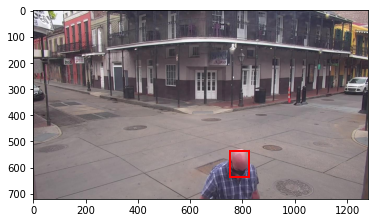

In [54]:
plot_img(train_dataset, 50)

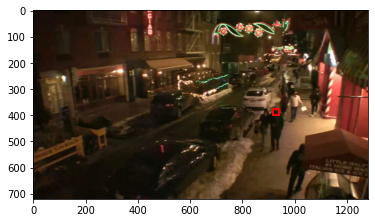

In [55]:
plot_img(train_dataset, 75)

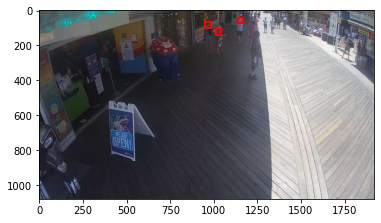

In [56]:
plot_img(val_dataset, 75)

Good, all looks correct. We can now develop and train our model accordingly.

### 5.2 Development and Training of the Object Detection Model

In [57]:
def get_model_object_detector(num_classes, pretrained=True):
    """ Load pre-trained Faster RCNN object detection model
        and build a new prediction head for our UAV task 
    """
    if pretrained:
        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    else: 
        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False,
                                                        pretrained_backbone=False)
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [58]:
# clear GPU if in use
if device.type == 'cuda':
    torch.cuda.empty_cache()

# clear memory to avoid GPU memory issues
gc.collect()

29243

In [59]:
# initialise model with two classes (3 total classes - including background)
N_CLASSES = len(OBJECT_CLASS_MAP.keys()) + 1
model = get_model_object_detector(N_CLASSES)
model.to(device)

# set up hyper-parameters for training
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, 
                            weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 
                                               step_size=3, gamma=0.1)
num_epochs = 4

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

Let's now train our model on the dataset, gathering our results in the process.

As an estimate for the following training process, it will take approximately 15 minutes per epoch (iteration through the entire dataset) subject to GPU used:

In [60]:
train_results = []
val_results = []

# train model for chosen number of epochs - get results for each
for epoch in range(num_epochs):
        # train for one epoch
        train_log = train_one_epoch(model, optimizer, 
                                    train_dataloader, device, 
                                    epoch, print_freq=10)
        # update learning rate
        lr_scheduler.step()

        # evaluate on validation data
        eval_log = evaluate(model, val_dataloader, device=device)

        # update results containers
        train_results.append(train_log)
        val_results.append(eval_log)

Epoch: [0]  [  0/776]  eta: 2:36:17  lr: 0.000011  loss: 1.4099 (1.4099)  loss_classifier: 1.0844 (1.0844)  loss_box_reg: 0.0455 (0.0455)  loss_objectness: 0.1723 (0.1723)  loss_rpn_box_reg: 0.1077 (0.1077)  time: 12.0843  data: 0.7743  max mem: 4913
Epoch: [0]  [ 10/776]  eta: 0:28:28  lr: 0.000076  loss: 1.3072 (1.3109)  loss_classifier: 1.0664 (1.0324)  loss_box_reg: 0.1269 (0.1281)  loss_objectness: 0.1205 (0.1175)  loss_rpn_box_reg: 0.0165 (0.0328)  time: 2.2309  data: 0.0862  max mem: 8295
Epoch: [0]  [ 20/776]  eta: 0:22:06  lr: 0.000140  loss: 1.0414 (1.0519)  loss_classifier: 0.7845 (0.7963)  loss_box_reg: 0.1130 (0.1196)  loss_objectness: 0.0943 (0.1031)  loss_rpn_box_reg: 0.0153 (0.0328)  time: 1.2379  data: 0.0179  max mem: 8295
Epoch: [0]  [ 30/776]  eta: 0:19:51  lr: 0.000205  loss: 0.5350 (0.8644)  loss_classifier: 0.2734 (0.6151)  loss_box_reg: 0.1130 (0.1293)  loss_objectness: 0.0607 (0.0919)  loss_rpn_box_reg: 0.0109 (0.0282)  time: 1.2483  data: 0.0183  max mem: 8295

Lets view some of the training / evaluation metrics obtained throughout the above training process:

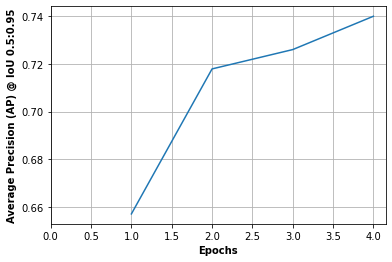

In [61]:
ap_iou_50_95 = [val_results[i].coco_eval['bbox'].stats[1] 
                    for i in range(len(val_results))]

plt.figure(figsize=(6,4))
plt.plot(range(1, len(val_results)+1), ap_iou_50_95)
plt.xlabel('Epochs', weight='bold')
plt.ylabel('Average Precision (AP) @ IoU 0.5:0.95', weight='bold')
plt.grid()
plt.xlim(0.0)
plt.show()

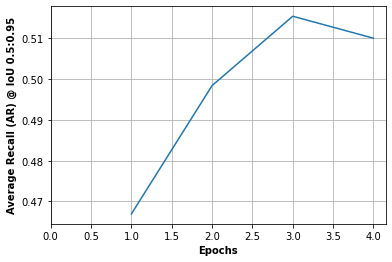

In [62]:
ar_iou_50_95 = [val_results[i].coco_eval['bbox'].stats[8] 
                    for i in range(len(val_results))]

plt.figure(figsize=(6,4))
plt.plot(range(1, len(val_results)+1), ar_iou_50_95)
plt.xlabel('Epochs', weight='bold')
plt.ylabel('Average Recall (AR) @ IoU 0.5:0.95', weight='bold')
plt.grid()
plt.xlim(0.0)
plt.show()

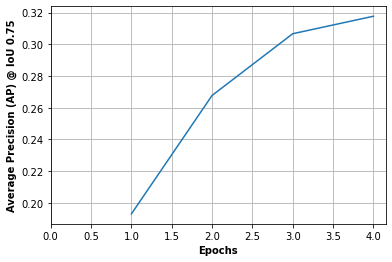

In [63]:
ap_iou_75 = [val_results[i].coco_eval['bbox'].stats[2] 
                    for i in range(len(val_results))]

plt.figure(figsize=(6,4))
plt.plot(range(1, len(val_results)+1), ap_iou_75)
plt.xlabel('Epochs', weight='bold')
plt.ylabel('Average Precision (AP) @ IoU 0.75', weight='bold')
plt.grid()
plt.xlim(0.0)
plt.show()

Let's also look at the losses (and seperate loss components), just to ensure our model is training and reducing the loss as expected:

In [64]:
training_losses = [res.meters['loss'].avg for res in train_results]
clf_train_losses = [res.meters['loss_classifier'].avg for res in train_results]
bbox_train_losses = [res.meters['loss_box_reg'].avg for res in train_results]

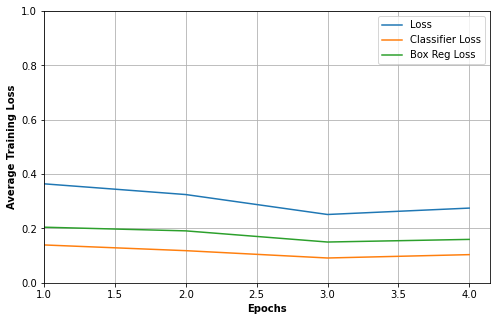

In [65]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(training_losses)+1), training_losses, 
         color='tab:blue', label='Loss')
plt.plot(range(1, len(training_losses)+1), clf_train_losses, 
         color='tab:orange', label='Classifier Loss')
plt.plot(range(1, len(training_losses)+1), bbox_train_losses, 
         color='tab:green', label='Box Reg Loss')
plt.xlabel('Epochs', weight='bold')
plt.ylabel('Average Training Loss', weight='bold')
plt.legend(loc='upper right')
plt.grid()
plt.xlim(1)
plt.ylim(0.0, 1.0)
plt.show()

It seems like four epochs might actually be sufficient for training the model, since the average precision and average recall performances seem to deminish beyond this point. This is also good, since it saves a large amount of training time.

### 5.3 Example predictions on individual samples from validation data:

Next, let's test our model on individual predictions with examples from the validation data:

In [66]:
def make_predictions(torch_img, model, threshold=0.2):
    """ Model inference function on new single image """
    # put our model in evaluation mode
    model.eval()
    with torch.no_grad():
        prediction = model([img.to(device)])[0]
    
    # get bounding boxes and scores
    boxes = prediction['boxes'].data.cpu().numpy()
    scores = prediction['scores'].data.cpu().numpy()
    classes = prediction['labels'].data.cpu().numpy()
    
    # keep predictions above designated threshold
    boxes = boxes[scores >= threshold].astype(np.int32)
    classes = classes[scores >= threshold]
    scores = scores[scores >= threshold]
    
    return boxes, scores, classes


def image_convert(image):
    """ Process image for visualising """
    image = image.clone().cpu().numpy()
    image = image.transpose((1,2,0))
    image = (image * 255).astype(np.uint8)
    return image


def plot_img_bbox(img, target, classes, figsize=(6,5)):
    """ Plot image array and provided bounding-box(es) """
    
    # set up fig and plot base image
    fig, ax = plt.subplots(1,1, figsize=figsize)
    ax.imshow(img)
    
    # get co-ords for each box and add to plot
    for i, box in enumerate(target):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        
        # get object class id and convert to class name
        class_id = classes[i]
        class_name = OBJECT_CLASS_MAP[class_id]
        
        color = 'g' if class_id == 1 else 'r'
        
        bbox_rect = mpatches.Rectangle((x, y),
                                       width, height,
                                       linewidth = 2,
                                       edgecolor = color,
                                       facecolor = 'none')

        # add current bbox to axis
        ax.add_patch(bbox_rect)
    
    # add legend items if we are plotting our labels & preds together
    pred_lines = mpatches.Patch(color=(0.0, 1.0, 0.0), 
                                    label='Mask On')
    label_lines = mpatches.Patch(color=(1.0, 0.0, 0.0), 
                                     label='Mask Off')
    ax.legend(handles=[pred_lines, label_lines], loc='upper left', 
              framealpha=0.7)
    
    ax.axis('off')
    plt.show()

Number of predicted boxes: 1
Number of actual (annotated) boxes: 1



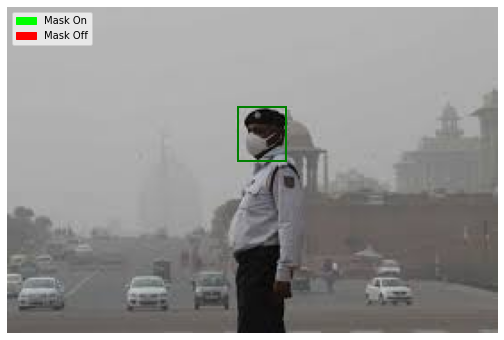

In [67]:
# make predictions on sample from validation data
img, target = val_dataset[50]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,6))

Number of predicted boxes: 1
Number of actual (annotated) boxes: 1



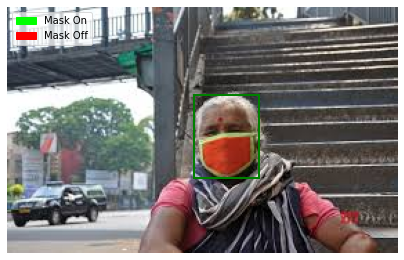

In [68]:
# make predictions on sample from validation data
img, target = val_dataset[19]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(7,5))

Number of predicted boxes: 1
Number of actual (annotated) boxes: 1



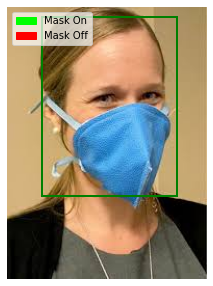

In [69]:
# make predictions on sample from validation data
img, target = val_dataset[25]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(7,5))

Number of predicted boxes: 2
Number of actual (annotated) boxes: 2



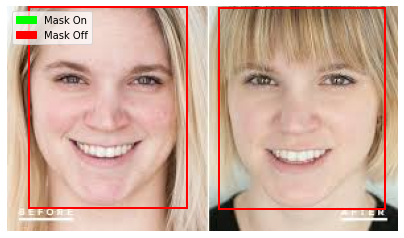

In [70]:
# make predictions on sample from validation data
img, target = val_dataset[30]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(7,5))

Number of predicted boxes: 4
Number of actual (annotated) boxes: 4



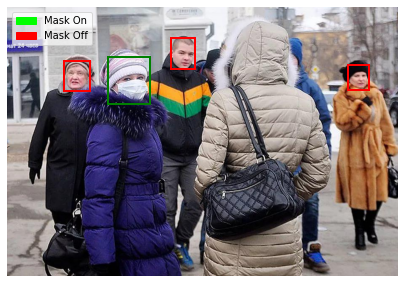

In [71]:
# make predictions on sample from validation data
img, target = val_dataset[36]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(7,6))

Number of predicted boxes: 1
Number of actual (annotated) boxes: 1



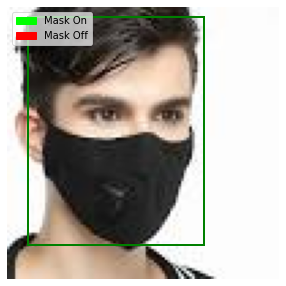

In [72]:
# make predictions on sample from validation data
img, target = val_dataset[41]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model)

print(f"Number of predicted boxes: {len(pred_bboxes)}")
print(f"Number of actual (annotated) boxes: {len(target['labels'])}\n")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(7,5))

## 6. Save model for downloading and future inference:

Lets save the model and results post training (this can then be downloaded, retained, and used for inference):

In [73]:
# save model and results locall after training
torch.save(model.state_dict(), 'model.pth')
torch.save({'epoch':epoch, 'model_state_dict': model.state_dict(), 
            'optimiser_state_dict': optimizer.state_dict()}, 'checkpoint.pth')

In [74]:
!ls

checkpoint.pth		     group_by_aspect_ratio.py  README.md
coco_eval.py		     __MACOSX		       sample_data
coco_utils.py		     model.pth		       train.py
custom_mask_dataset_cleaned  presets.py		       transforms.py
drive			     __pycache__	       utils.py
engine.py		     pytorch_detection_tools


In [75]:
# also save these to drive for later loading
drive_save_path = "drive/My Drive/ML_Data/Mask_Object_Detection"
torch.save(model.state_dict(), 
           f"{drive_save_path}/model.pth")
torch.save({'epoch':epoch, 'model_state_dict': model.state_dict(), 
            'optimiser_state_dict': optimizer.state_dict()}, 
           f"{drive_save_path}/checkpoint.pth")

In [76]:
!ls {DRIVE_DATA_DIR}

checkpoint.pth				   model.pth
holdout_test				   models
mask_classification_ext.zip		   sample_test_dataset.zip
mask_classification.zip			   test_set_extracted_regions.zip
mask_object_detection_dataset_cleaned.zip  test_videos


Good, our trained model is saved and can be downloaded / re-loaded as needed.

## 7. Inference on test data and new examples:

### 7.1 Definition of a Unlabelled Dataset:

To perform inference on new examples, we need to define a dataset that does not have labels only inputs.

In [77]:
class MaskUnlabelledDataset(torch.utils.data.Dataset):
    """ Custom test dataset, returns only images, no labels """
    def __init__(self, image_names, data_dir, transforms=None):
        self.data_dir = data_dir
        self.test_images = image_names

    def __getitem__(self, idx: int):
        # set image path, load, standardise and convert to tensor
        img_name = self.test_images[idx]
        img_id = str(img_name[:-4])
        img_path = os.path.join(self.data_dir, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img /= 255.0
        img = torchvision.transforms.ToTensor()(img)
        return img, img_id

    def __len__(self):
        return len(self.test_images)

In [78]:
# initialise test dataset using our test dataframe
test_dataset = MaskUnlabelledDataset(image_names=test_df.filename.unique(), 
                                     data_dir=IMAGE_DIR)

# create associated test dataloader
test_dataloader = DataLoader(
    test_dataset,
    batch_size=2,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn)

### 7.2 Load pre-trained (existing) model

Load existing model (if training was not conducted above):

In [79]:
# set appropriate path to model (depending on where it was saved above)
saved_model_path = os.path.join(drive_save_path, 'model.pth')

In [80]:
# initialise model 
model = get_model_object_detector(N_CLASSES, pretrained=False)

# load model weights gained from training
model.load_state_dict(torch.load(saved_model_path))

# set evaluation mode for model
model.eval()

# set model to device (CPU/GPU) as required
model.to(device)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and will be removed in 0.15, please use 'weights_backbone' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

### 7.3 Define inference function / pipeline for new inputs

In [81]:
# set appropriate detection theshold
detection_threshold = 0.5
pred_results = []

# iteratively make predictions for all of the test data
for imgs, img_ids in tqdm(test_dataloader):

    # send imgs to cpu / gpu and predict with our model
    images = list(img.to(device) for img in imgs)
    outputs = model(images)
    
    # iterate through all images and make predictions
    for i, image in enumerate(images):

        # get bounding boxes and scores
        boxes = outputs[i]['boxes'].data.cpu().numpy()
        scores = outputs[i]['scores'].data.cpu().numpy()
        classes = outputs[i]['labels'].data.cpu().numpy()
        
        # keep predictions above designated threshold
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        classes = classes[scores >= detection_threshold]
        scores = scores[scores >= detection_threshold]
        img_id = img_ids[i]

        # append results for each image to our results container
        if len(scores) < 1:
            result = {'image_id' : img_id, 'object' : 0,
                      'confidence' : 0.0, 
                      'x_min' : 0.0, 'y_min' : 0.0, 
                      'x_max' : 0.0, 'y_max' : 0.0}
            pred_results.append(result)

        # if we have multiple image preds, add all to our results
        else:
            for i, score in enumerate(scores):
                result = {'image_id' : img_id, 'object' : classes[i],
                          'confidence' : score,
                          'x_min' : boxes[i][0], 'y_min' : boxes[i][1],
                          'x_max' : boxes[i][2], 'y_max' : boxes[i][3]}
                pred_results.append(result)

# create a final dataframe with all predictions
pred_df = pd.DataFrame(pred_results, 
                       columns=['image_id', 'object', 
                                'confidence', 
                                'x_min', 'y_min', 
                                'x_max', 'y_max'])

  1%|          | 2/274 [00:01<02:24,  1.88it/s]


RuntimeError: ignored

Most-confident predictions made:

In [ ]:
pred_df.head()

,image_id,object,confidence,x_min,y_min,x_max,y_max
0,MOXA_76,1,0.995562,726.0,347.0,782.0,422.0
1,MOXA_76,1,0.990165,549.0,204.0,615.0,284.0
2,MOXA_76,1,0.980329,408.0,284.0,470.0,362.0
3,MOXA_2944,1,0.989163,142.0,32.0,175.0,74.0
4,MOXA_2944,2,0.982990,26.0,40.0,53.0,80.0


In [ ]:
sorted_preds = pred_df.sort_values('confidence', ascending=False)
sorted_preds.head(10)

,image_id,object,confidence,x_min,y_min,x_max,y_max
1155,MOXA_602,1,0.998921,286.0,15.0,674.0,483.0
1750,MOXA_1549,1,0.998507,13.0,21.0,183.0,245.0
1824,MOXA_150,1,0.998461,127.0,28.0,421.0,378.0
1912,MOXA_447,1,0.998454,142.0,170.0,523.0,603.0
501,MOXA_603,1,0.998286,266.0,117.0,692.0,639.0
1454,MOXA_647,1,0.998167,394.0,142.0,718.0,525.0
1825,MOXA_2765,1,0.998062,10.0,23.0,118.0,170.0
1417,MOXA_945,1,0.998040,149.0,12.0,241.0,133.0
1826,MOXA_2765,1,0.997956,138.0,27.0,249.0,170.0
1249,MOXA_125,1,0.997904,251.0,17.0,961.0,673.0


In [ ]:
sorted_preds.tail(20)

,image_id,object,confidence,x_min,y_min,x_max,y_max
675,MOXA_33,1,0.504340,312.0,475.0,370.0,549.0
2022,MOXA_22,1,0.502947,174.0,388.0,222.0,454.0
861,MOXA_2930,1,0.502927,86.0,45.0,130.0,108.0
1892,catsmeow2 catsmeow232_1599344636.9255831,2,0.502736,276.0,294.0,298.0,318.0
89,Thrashers_french_fries_ocean_city thrashers_fr...,1,0.501376,621.0,109.0,650.0,143.0
1704,Alpine Lodge Ketchum Idaho image27000_15937184...,1,0.501255,545.0,773.0,574.0,803.0
934,Alpine_Lodge_Ketchum_Idaho alpine_lodge_004 (15),0,0.000000,0.0,0.0,0.0,0.0
199,catsmeow2 catsmeow229_1595809390.354476,0,0.000000,0.0,0.0,0.0,0.0
1430,bourbon_street bourbon_street21_1604352798.771363,0,0.000000,0.0,0.0,0.0,0.0
1660,Apgar_Village maryland_broadwalk_7,0,0.000000,0.0,0.0,0.0,0.0


In [ ]:
# gather our most confident predictions 
top_ids = sorted_preds.image_id.unique()

if len(top_ids) > 14:
    top_image_ids = list(sorted_preds.image_id.unique()[:15])
else:
    top_image_ids = list(top_ids)

### 7.4 Visualising and Exploring New Predictions

In [ ]:
def plot_preds_with_truth(preds_df, img_id, labels_df, 
                          data_dir=IMAGE_DIR, figsize=(6,4), 
                          with_labels=True, image_ext=IMAGE_EXT):
    """ Helper function for plotting img & bboxes """ 

    # get bounding box preds and confidences
    img_preds = preds_df.loc[preds_df['image_id'] == img_id].copy()
    box_preds = img_preds[['x_min', 'y_min', 
                       'x_max', 'y_max']].astype(int).values
    confidence = img_preds['confidence'].values

    # get ground truth bbox labels
    img_labels = labels_df.loc[labels_df['filename'] == 
                               f"{img_id}{image_ext}"].copy()
    box_labels = img_labels[['x_min', 'y_min', 
                       'x_max', 'y_max']].astype(int).values

    # load img and process as per original datasets
    img = cv2.imread(f"{data_dir}/{img_id}{image_ext}", cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
    img /= 255.0
    img = torchvision.transforms.ToTensor()(img)

    # convert img back and plot boxes
    img = image_convert(img)
    img = np.ascontiguousarray(img)

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    
    # plot each bbox and annotate confidence
    for i, box in enumerate(box_preds):
        
        # get co-ords / dims for plotting bbox
        x, y = box[0], box[1]
        width, height = box[2] - box[0], box[3] - box[1]
        
        # plot current predicted bbox in green
        pred_rect = mpatches.Rectangle((x, y), width, height, 
                                       linewidth=2, edgecolor='g', 
                                       facecolor='none')
        # add each bbox to plot
        ax.add_patch(pred_rect)
        
        ax.text(box[0], box[1] - 5, f"{confidence[i]:.2f}", 
                bbox={"facecolor": "tab:green", "alpha": 0.4},
                clip_on=True)
    
    if with_labels:
        # also plot our ground truth labels (needs different loop - since it
        # might be different number to those predicted)
        for i, box in enumerate(box_labels):
        
            # get co-ords / dims for true boxes
            x, y = box[0], box[1]
            width, height = box[2] - box[0], box[3] - box[1]
        
            # plot ground-truth labels in blue
            true_rect = mpatches.Rectangle((x, y), width, height, 
                                           linewidth=2, edgecolor='b', 
                                           facecolor='none')
            # add each bbox to plot
            ax.add_patch(true_rect)
            
        # add legend items if we are plotting our labels & preds together
        pred_lines = mpatches.Patch(color=(0.0, 1.0, 0.0), 
                                    label='Predictions')
        label_lines = mpatches.Patch(color=(0.0, 0.0, 1.0), 
                                     label='Ground Truth')
        ax.legend(handles=[pred_lines, label_lines], loc='upper left', 
                   framealpha=0.2)
        
    # hide our x and y-ticks on the axes
    ax.axis('off')

    ax.imshow(img)
    return fig

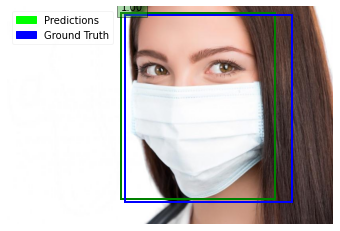

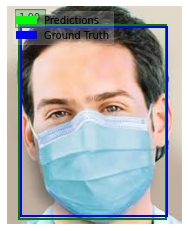

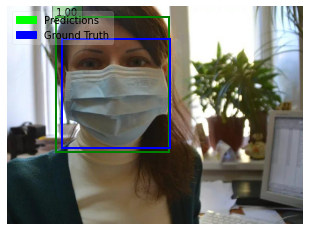

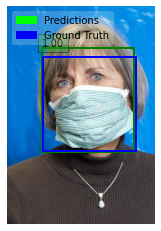

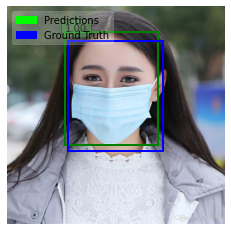

...

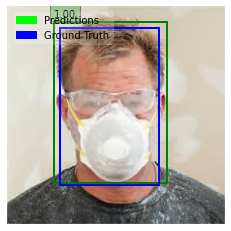

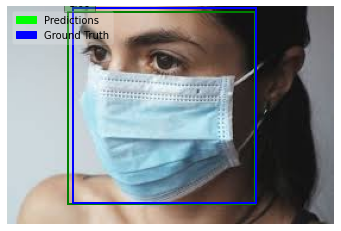

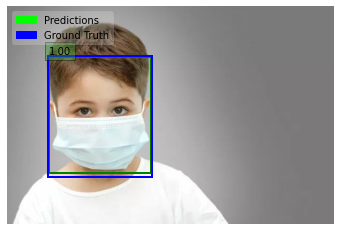

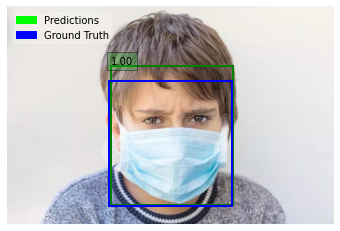

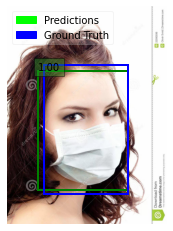

In [ ]:
for i, image_id in enumerate(top_image_ids):
    plot_preds_with_truth(pred_df, image_id, mask_df)
    current_plot = f"test_pred_{i}.jpg"
    plt.show()

Not too bad... especially when considering this is test (unseen) data.

Lets now look at the least-confident:

In [ ]:
# gather our least confident predictions (note - still above our min threshold)
top_ids = sorted_preds.image_id.unique()

if len(top_ids) > 20:
    least_confident_image_ids = list(sorted_preds.image_id.unique()[-20:])
else:
    least_confident_image_ids = list(top_ids)

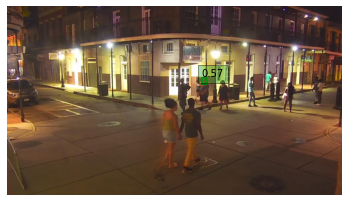

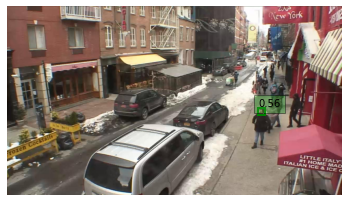

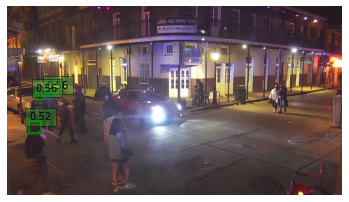

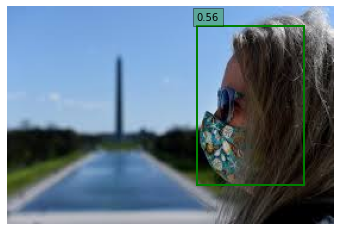

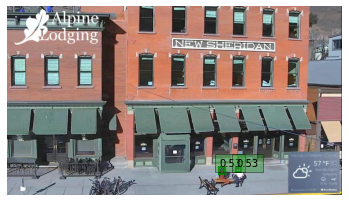

...

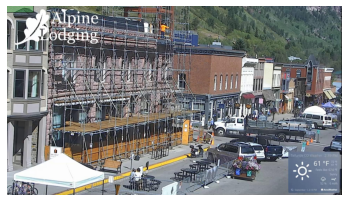

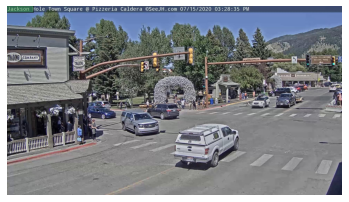

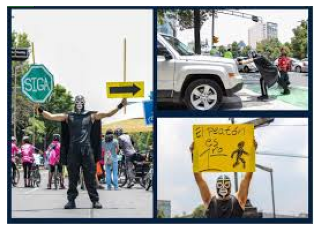

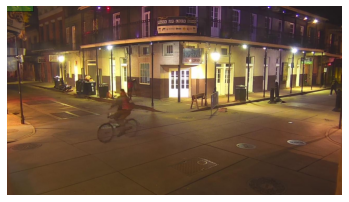

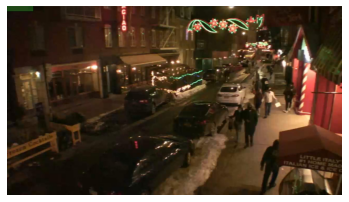

In [ ]:
for i, image_id in enumerate(least_confident_image_ids):
    plot_preds_with_truth(pred_df, image_id, mask_df, with_labels=False)
    current_plot = f"test_pred_{i}.png"
    plt.show()

Still not too bad, since the really strange / erroneous predictions did have a low confidence attributed to them. All in all, the quality appears to be quite good.

It's definitely now worth moving away from these images and testing the model performance on completely novel image instances, similar to what we need with the project.

## 8. Inference on completely new image data (sample dataset uploaded)

In [ ]:
NEW_DATA_DIR = "drive/My Drive/ML_Data/Mask_Object_Detection/holdout_test"

In [ ]:
new_img_files = [x for x in os.listdir(NEW_DATA_DIR) if x.endswith('.png')]

Similarly to last time, lets make this into a new unlabelled dataset:

In [ ]:
# initialise test dataset using our test dataframe
unseen_dataset = MaskUnlabelledDataset(image_names=new_img_files, 
                                       data_dir=NEW_DATA_DIR)

# create associated test dataloader
unseen_dataloader = DataLoader(
    unseen_dataset,
    batch_size=2,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn)

Number of predicted boxes: 3


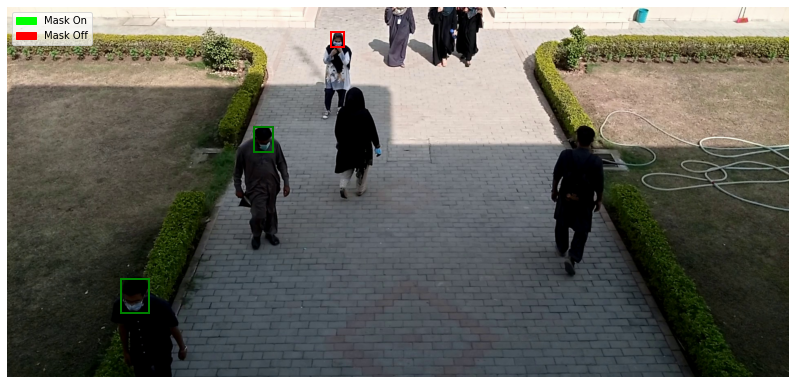

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[0]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.5)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(14,8))

Number of predicted boxes: 2


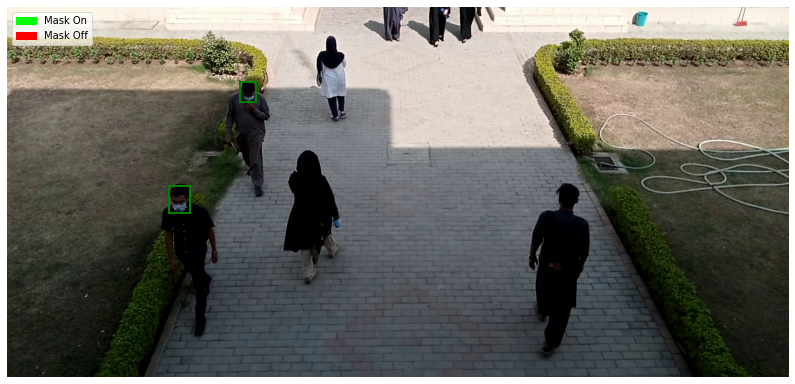

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[1]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.5)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(14,8))

Number of predicted boxes: 9


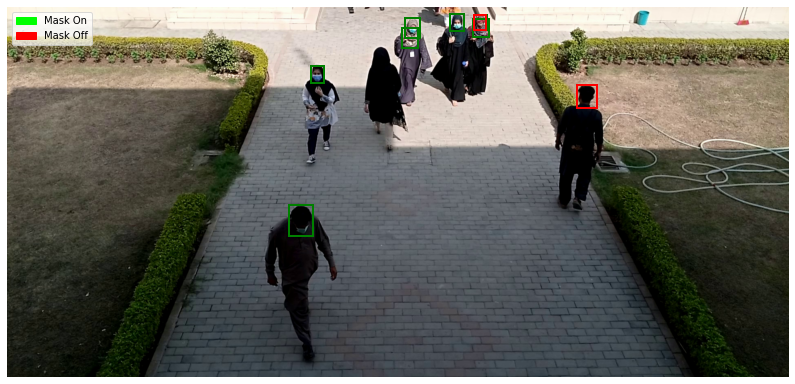

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[2]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(14,8))

Number of predicted boxes: 7


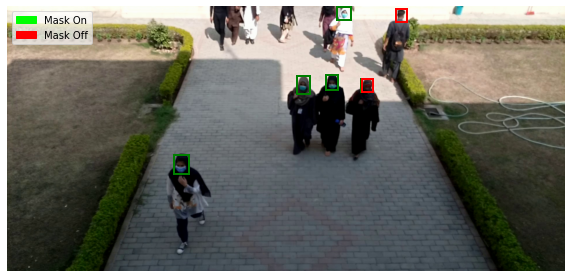

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[3]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.25)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 7


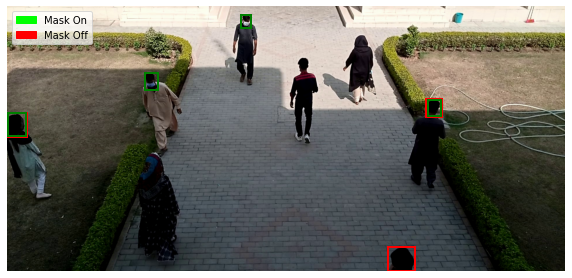

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[4]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 5


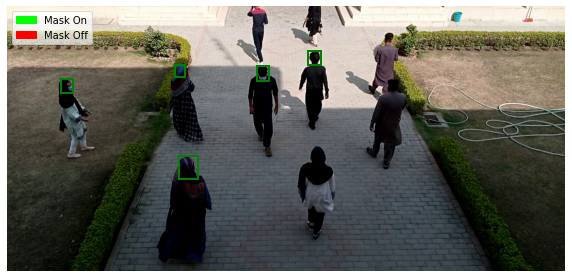

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[5]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.25)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 9


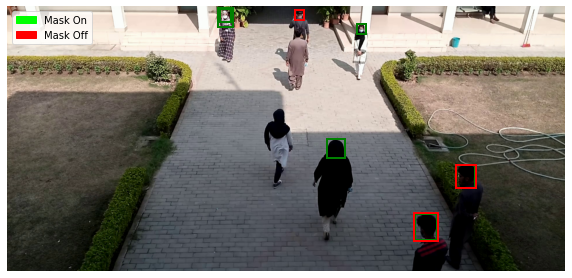

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[6]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.25)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 7


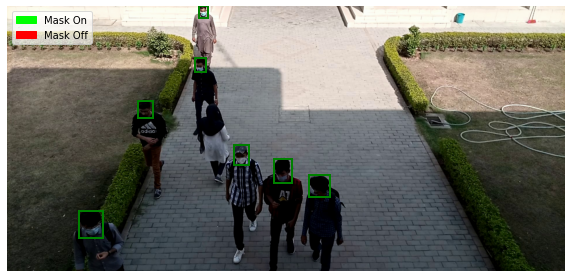

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[7]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.6)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 9


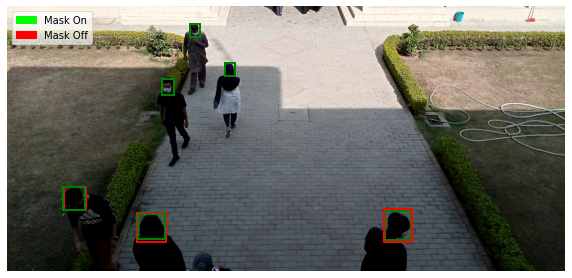

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[8]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 7


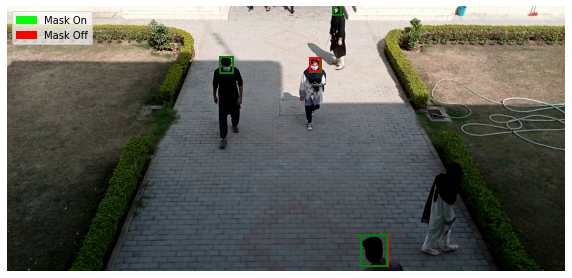

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[9]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.01)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 9


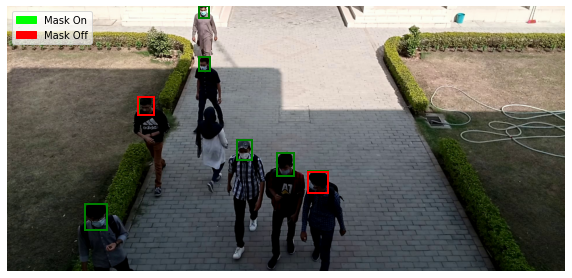

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[10]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.2)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 3


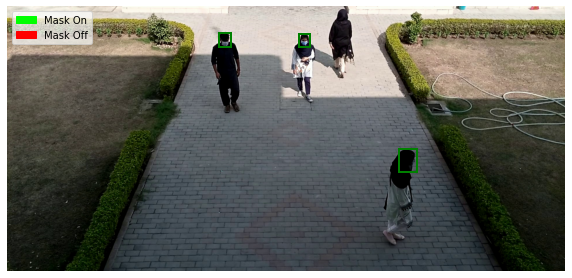

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[11]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.4)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 2


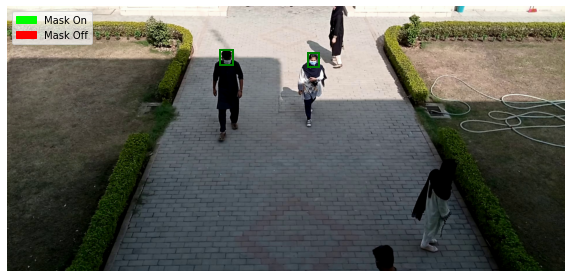

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[12]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.4)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 10


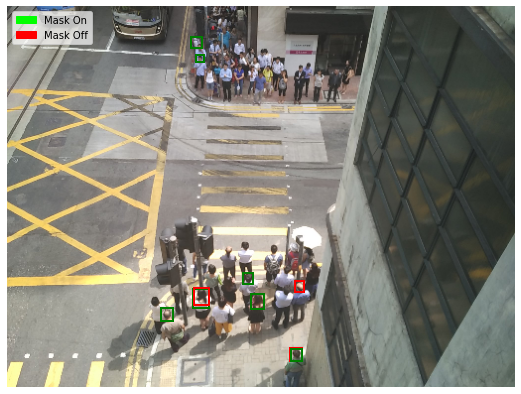

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[17]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 8


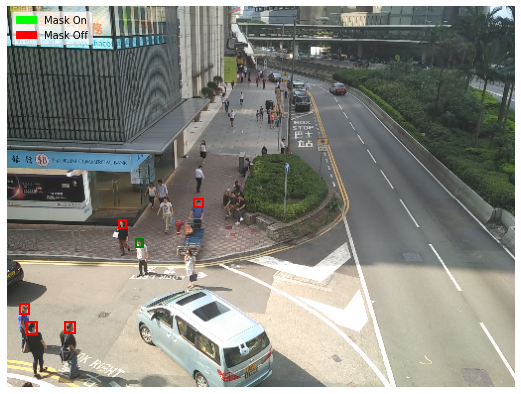

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[18]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Number of predicted boxes: 8


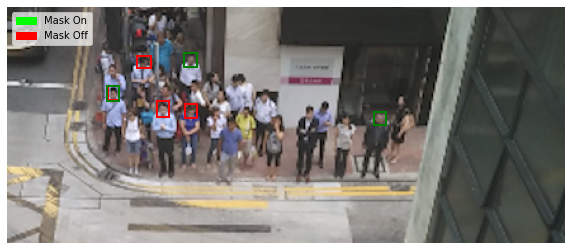

In [ ]:
# make predictions on sample from validation data
img, img_id = unseen_dataset[19]

# get predicted boxes and scores for sample image
pred_bboxes, pred_scores, pred_classes = make_predictions(img, model, threshold=0.1)

print(f"Number of predicted boxes: {len(pred_bboxes)}")

# plot predicted box on image
plot_img_bbox(image_convert(img), pred_bboxes, pred_classes, figsize=(10,7))

Not too bad when considering this data is completely new and unseen (and even very different contextually) relative to the original dataset this model was trained on.

There are still many improvements ideally though, which we should be able to obtain through use of better data that is representative of our chosen context (such as the images above).

The other challenge is the low confidence that our model gives for new images, like those tested above. It still detects their heads effectively, but it requires adjustment of the theshold in each case to obtain good predictions for each person in the scene. It's likely a greater range of suitable images would help improve this in the longer term.

A further consideration is the need to chop larger images (tiling) into smaller tiles, which makes the job of the object detector easier. It's likely this would produce better and more consistent results, especially for camera surveillance-type scenes where the image is typically very large, with people appearing small due to the size of the image.

From all the work performed in this notebook, we can now develop and application that makes use of the trained model (saved above) to make predictions on new data, and even video sequences, as required.